In [ ]:
import os
import numpy as np
import cv2 # OpenCV biblioteka
import matplotlib
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# iscrtavanje slika i grafika unutar samog browsera
%matplotlib inline 
# prikaz vecih slika 
matplotlib.rcParams['figure.figsize'] = 16,12

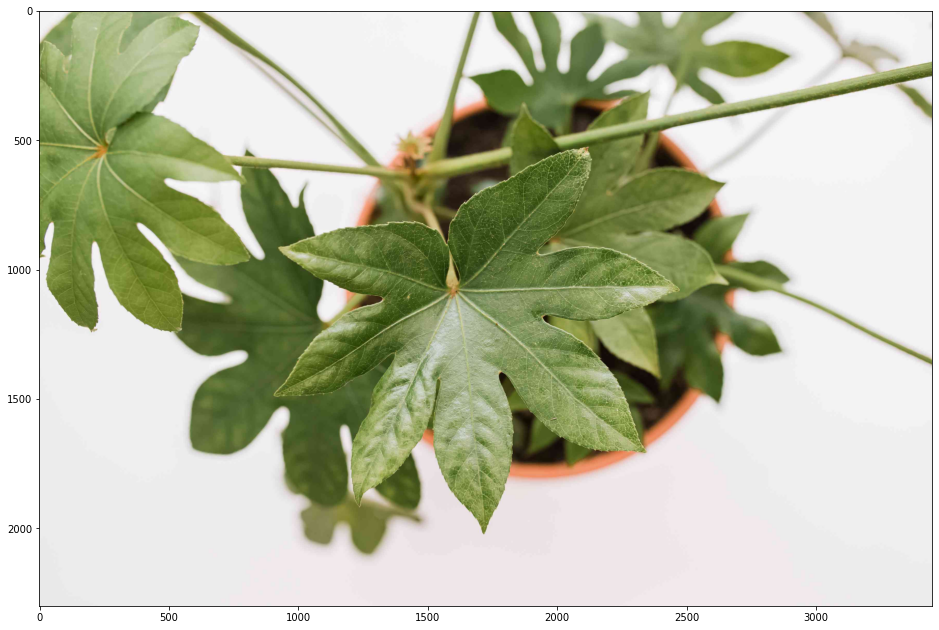

In [ ]:
img = cv2.imread('/content/japaneseAralia2.jpg') # ucitavanje slike sa diska
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # konvertovanje iz BGR u RGB model boja (OpenCV ucita sliku kao BGR)
plt.imshow(img)  # prikazivanje slike

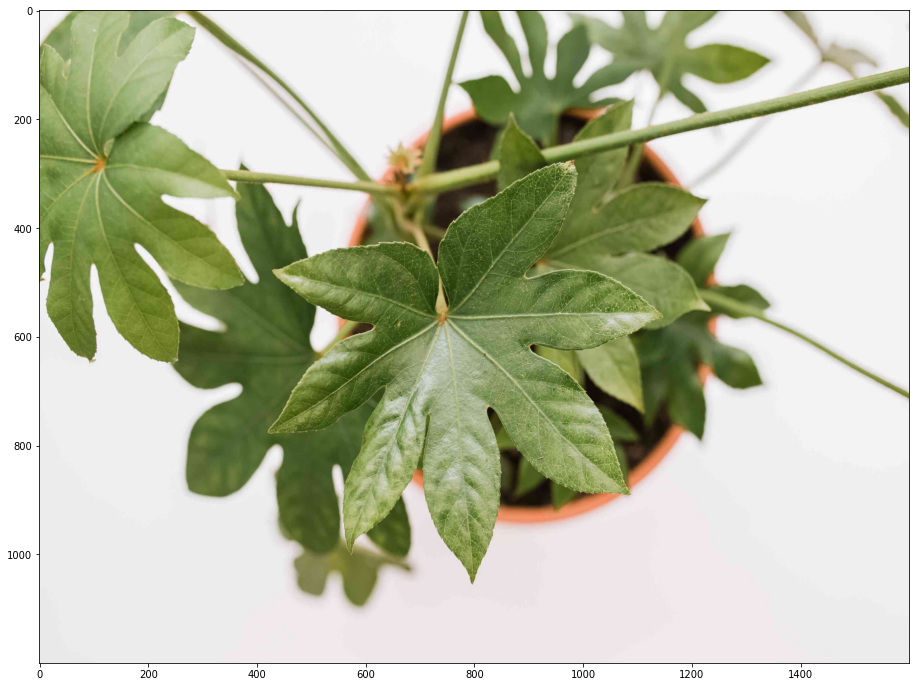

In [ ]:
resized_image = cv2.resize(img, (1600, 1200))
plt.imshow(resized_image,cmap="Greys_r")

In [ ]:
y,x,_ = img.shape
print(y,x,_)

2300 3450 3


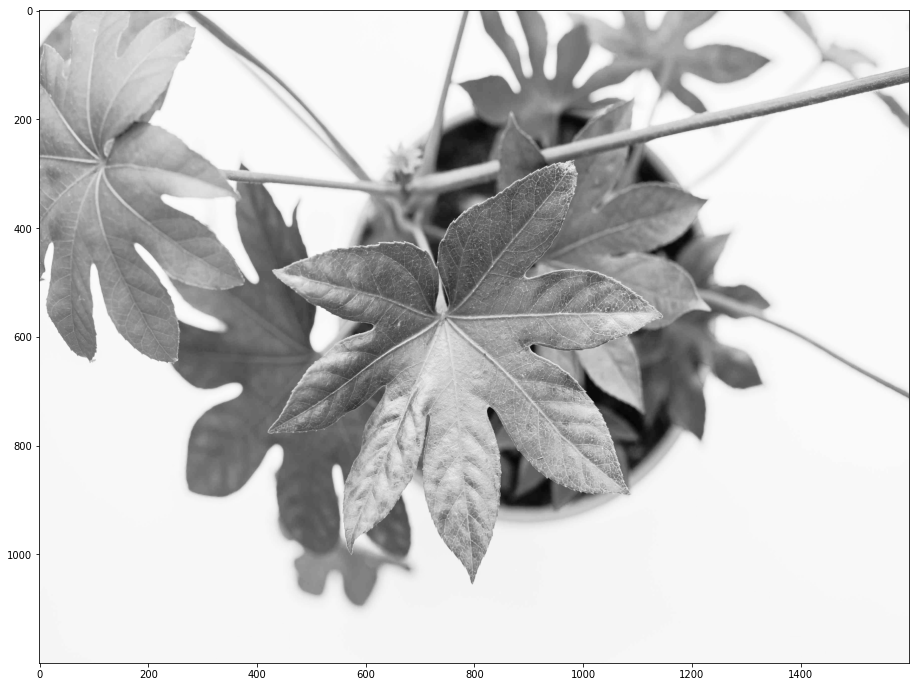

In [ ]:
gs = cv2.cvtColor(resized_image,cv2.COLOR_RGB2GRAY)
plt.imshow(gs,cmap="Greys_r")

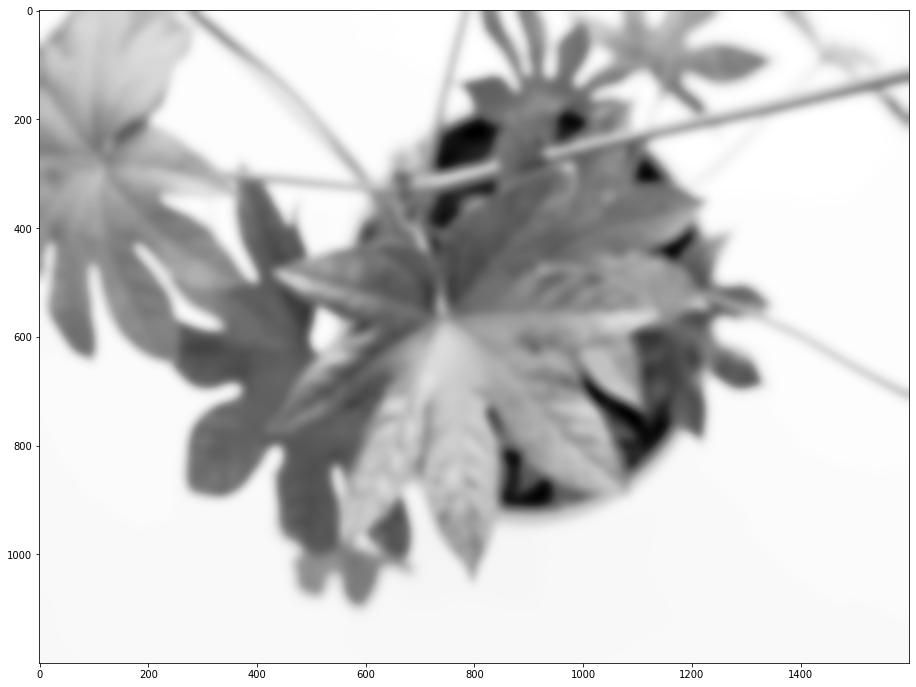

In [ ]:

blur = cv2.GaussianBlur(gs, (55,55),0)
plt.imshow(blur,cmap="Greys_r")

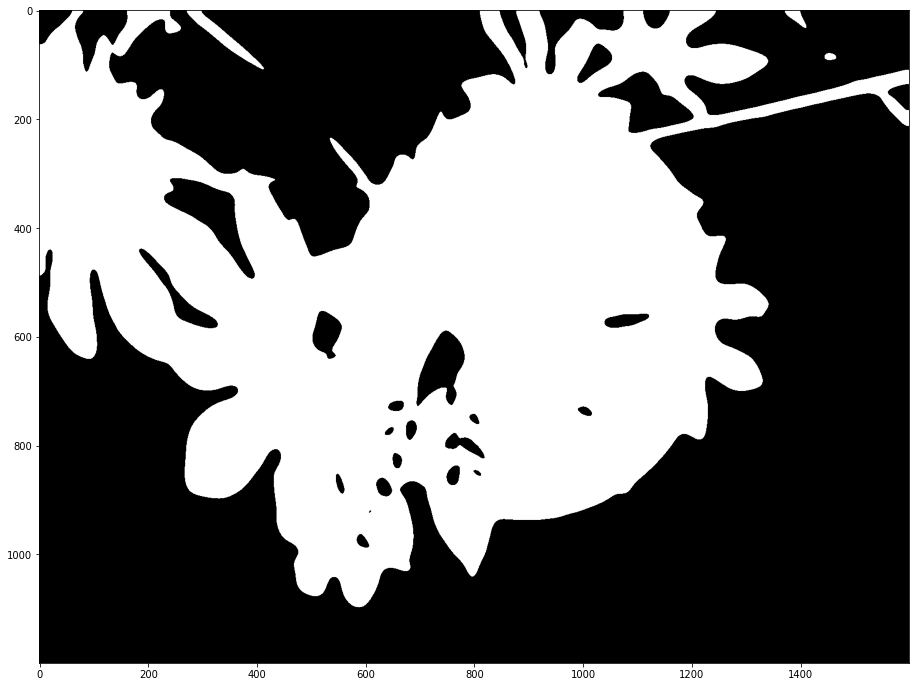

In [ ]:

ret_otsu,im_bw_otsu = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plt.imshow(im_bw_otsu,cmap='Greys_r')

In [ ]:
# pokusaj 2

In [ ]:
print(img.shape)  # shape je property Numpy array-a za prikaz dimenzija

(595, 522, 3)


In [ ]:
img

array([[[220, 219, 215],
        [221, 220, 216],
        [221, 220, 216],
        ...,
        [242, 243, 238],
        [242, 243, 238],
        [242, 243, 238]],

       [[221, 220, 216],
        [221, 220, 216],
        [221, 220, 216],
        ...,
        [243, 244, 239],
        [241, 242, 237],
        [241, 242, 237]],

       [[221, 220, 216],
        [221, 220, 216],
        [221, 220, 216],
        ...,
        [243, 244, 239],
        [242, 243, 238],
        [242, 243, 238]],

       ...,

       [[ 34,  21,  31],
        [ 26,  16,  25],
        [ 21,  16,  23],
        ...,
        [247, 250, 255],
        [247, 250, 255],
        [246, 249, 255]],

       [[ 36,  20,  31],
        [ 27,  15,  25],
        [ 19,  16,  23],
        ...,
        [242, 245, 254],
        [234, 238, 250],
        [232, 236, 248]],

       [[ 35,  19,  30],
        [ 27,  15,  25],
        [ 19,  16,  23],
        ...,
        [237, 240, 249],
        [224, 228, 240],
        [222, 226, 238]]

In [ ]:
img.dtype

dtype('uint8')

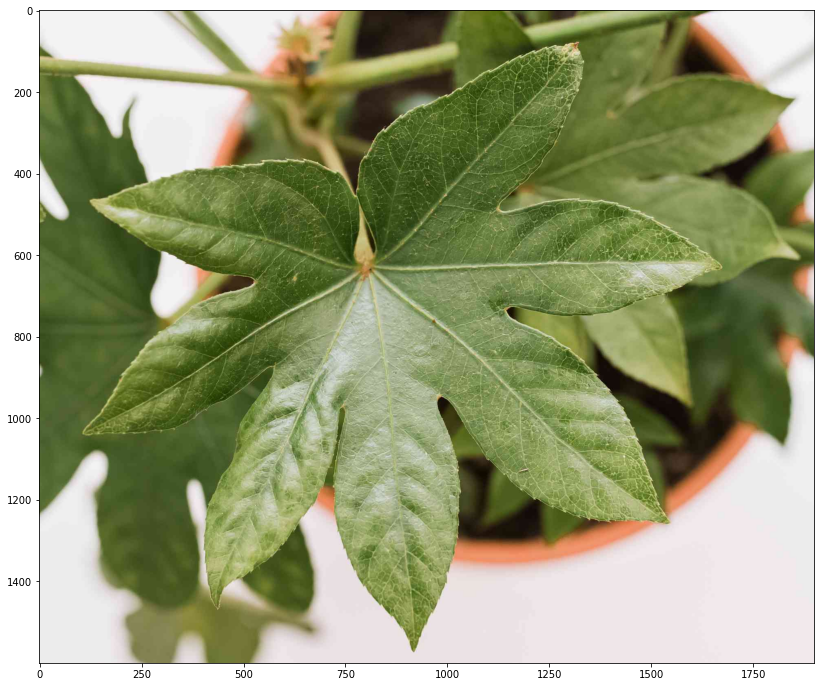

In [ ]:
img_crop = img[450:2050, 800:2700]  # prva koordinata je po visini (formalno red), druga po širini (formalo kolona)
plt.imshow(img_crop)

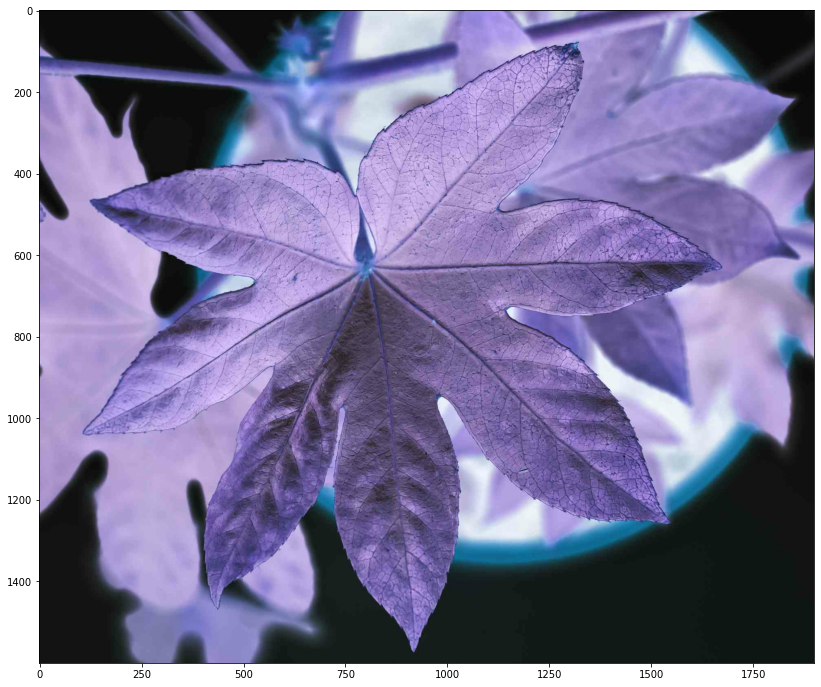

In [ ]:

img_crop = 255 - img_crop  # ako su pikeli u intervalu [0,255] ovo je ok, a ako su u intervalu [0.,1.] onda bi bilo 1. - img
plt.imshow(img_crop)

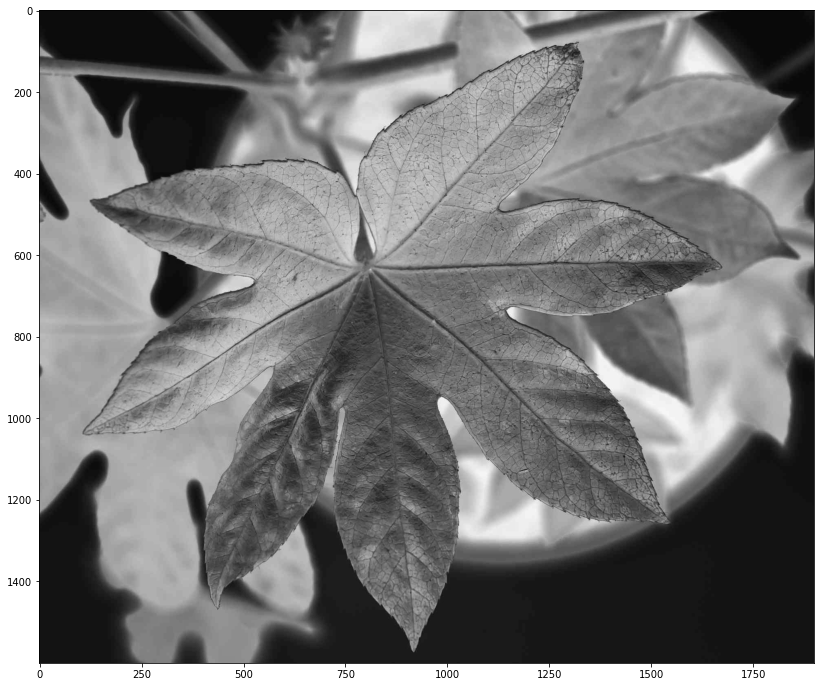

In [ ]:
img_rgb = img_crop
# implementacija metode perceptivne osvetljenosti
def my_rgb2gray(img_rgb):
    img_gray = np.ndarray((img_rgb.shape[0], img_rgb.shape[1]))  # zauzimanje memorije za sliku (nema trece dimenzije)
    img_gray = 0.21*img_rgb[:, :, 0] + 0.72*img_rgb[:, :, 1] + 0.07*img_rgb[:, :, 2]
    img_gray = img_gray.astype('uint8')  # u prethodnom koraku smo mnozili sa float, pa sada moramo da vratimo u [0,255] opseg
    return img_gray

img_gray = my_rgb2gray(img_crop)
plt.imshow(img_gray, 'gray') # kada se prikazuje slika koja nije RGB, obavezno je staviti 'gray' kao drugi parametar

In [ ]:
img_gray = cv2.cvtColor(img_crop, cv2.COLOR_RGB2GRAY)

In [ ]:
img_gray.shape

(1600, 1900)

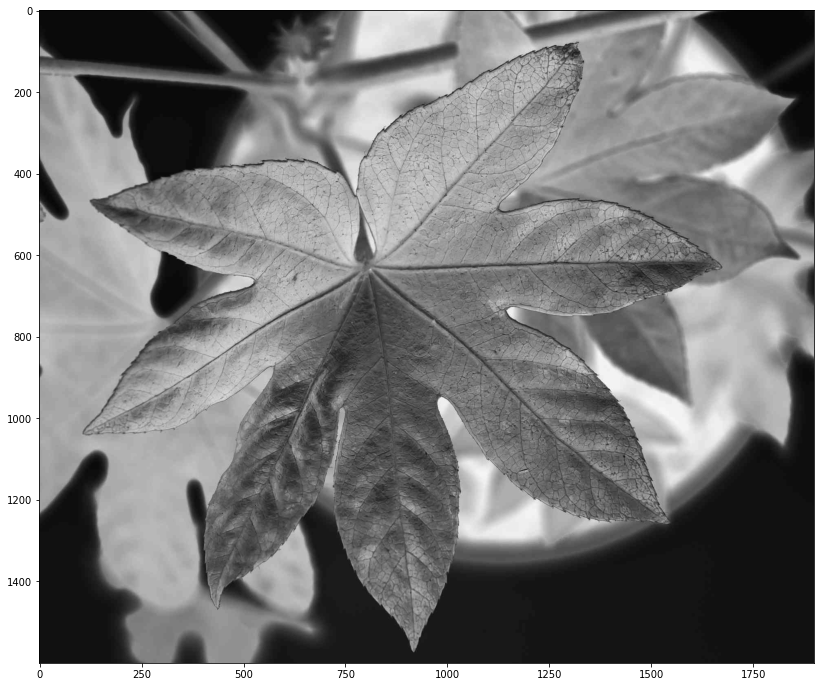

In [ ]:
plt.imshow(img_gray, 'gray')

In [ ]:
img_gray

array([[12, 12, 12, ..., 19, 19, 19],
       [12, 12, 12, ..., 19, 19, 19],
       [12, 12, 12, ..., 19, 19, 19],
       ...,
       [19, 19, 19, ..., 19, 19, 19],
       [19, 19, 19, ..., 19, 19, 19],
       [19, 19, 19, ..., 19, 19, 19]], dtype=uint8)

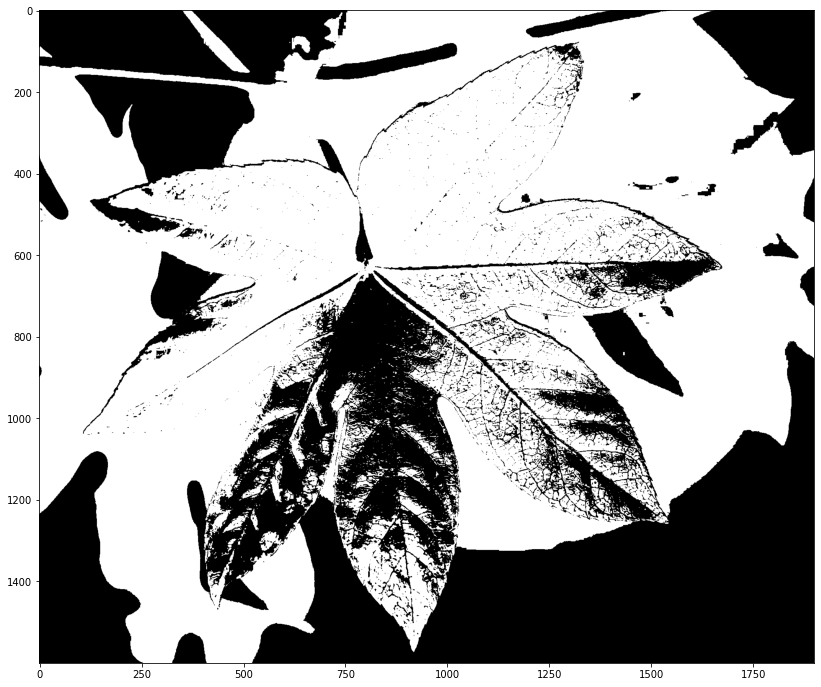

In [ ]:
img_tr = img_gray > 100  # svi piskeli koji su veci od 127 ce dobiti vrednost True, tj. 1, i obrnuto
plt.imshow(img_tr, 'gray')

100.0


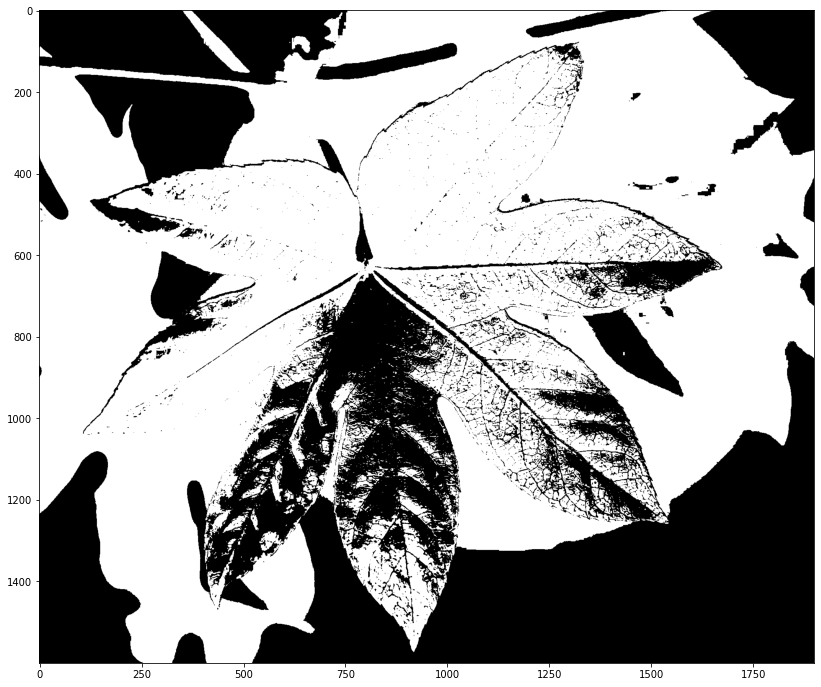

In [ ]:
ret, image_bin = cv2.threshold(img_gray, 100, 255, cv2.THRESH_BINARY) # ret je vrednost praga, image_bin je binarna slika
print(ret)
plt.imshow(image_bin, 'gray')

Otsu's threshold: 101.0


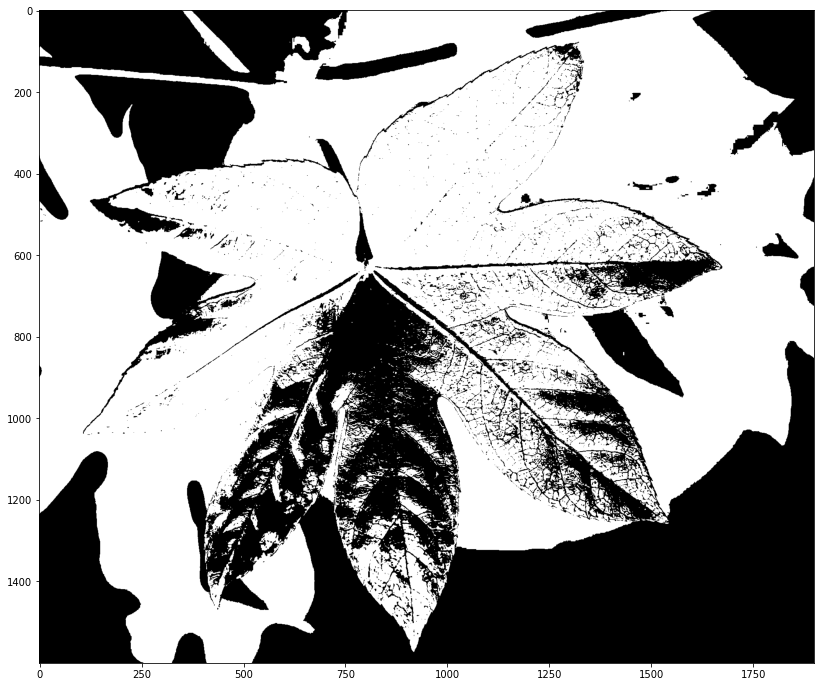

In [ ]:
ret, image_bin = cv2.threshold(img_gray, 0, 255, cv2.THRESH_OTSU) # ret je izracunata vrednost praga, image_bin je binarna slika
print("Otsu's threshold: " + str(ret))
plt.imshow(image_bin, 'gray')

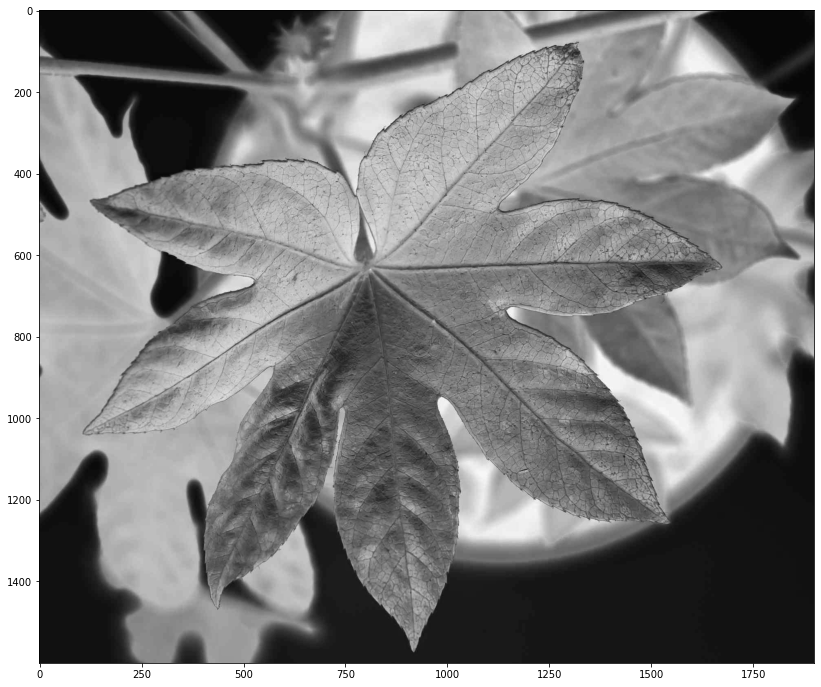

In [227]:
image_ada = cv2.cvtColor(img_crop, cv2.COLOR_BGR2GRAY)
plt.imshow(image_ada, 'gray')

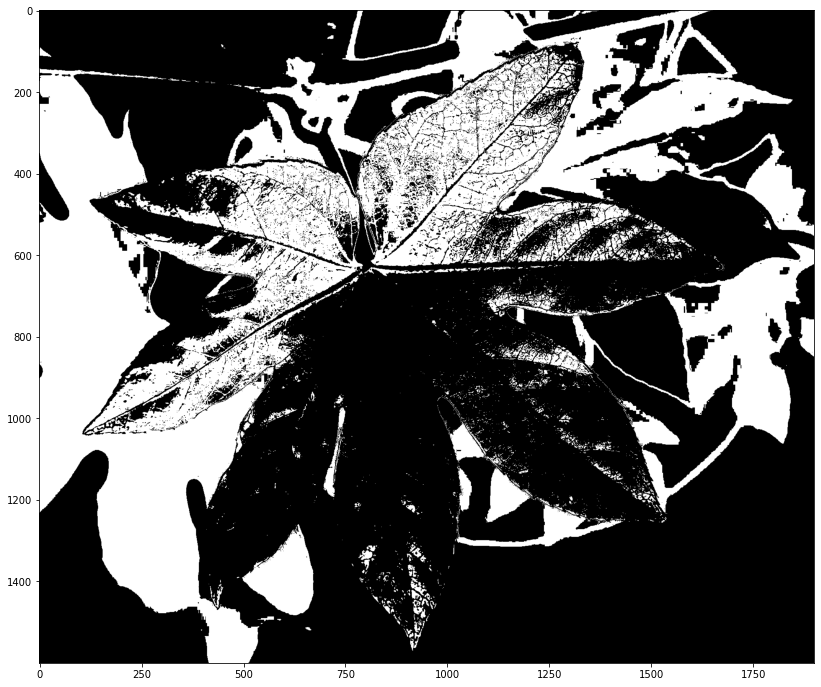

In [229]:

img_tr = (image_ada > 150) * (image_ada < 200)
plt.imshow(img_tr, 'gray')

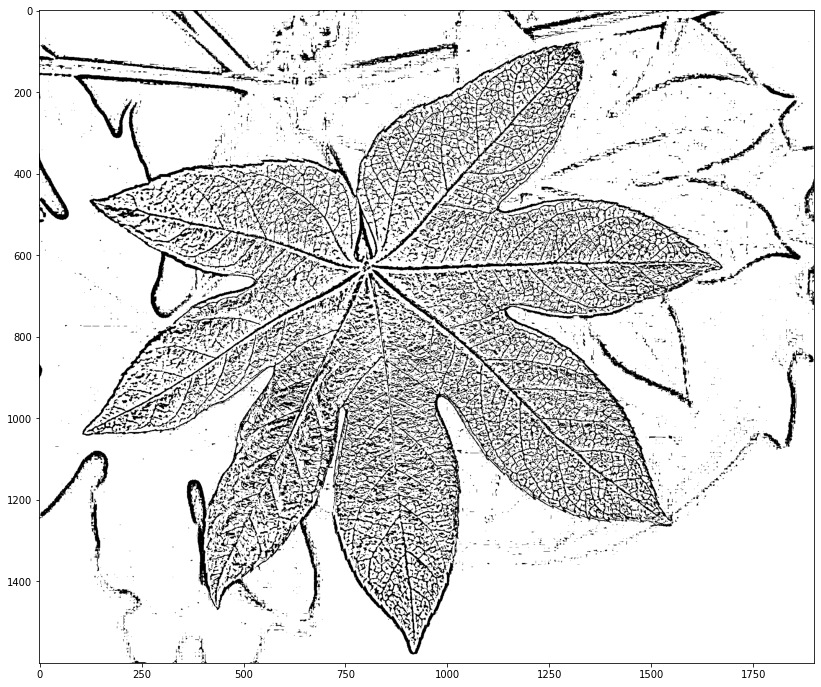

In [230]:

# adaptivni threshold gde se prag racuna = srednja vrednost okolnih piksela
image_ada_bin1 = cv2.adaptiveThreshold(image_ada, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, 5)
plt.figure() # ako je potrebno da se prikaze vise slika u jednoj celiji
plt.imshow(image_ada_bin1, 'gray')


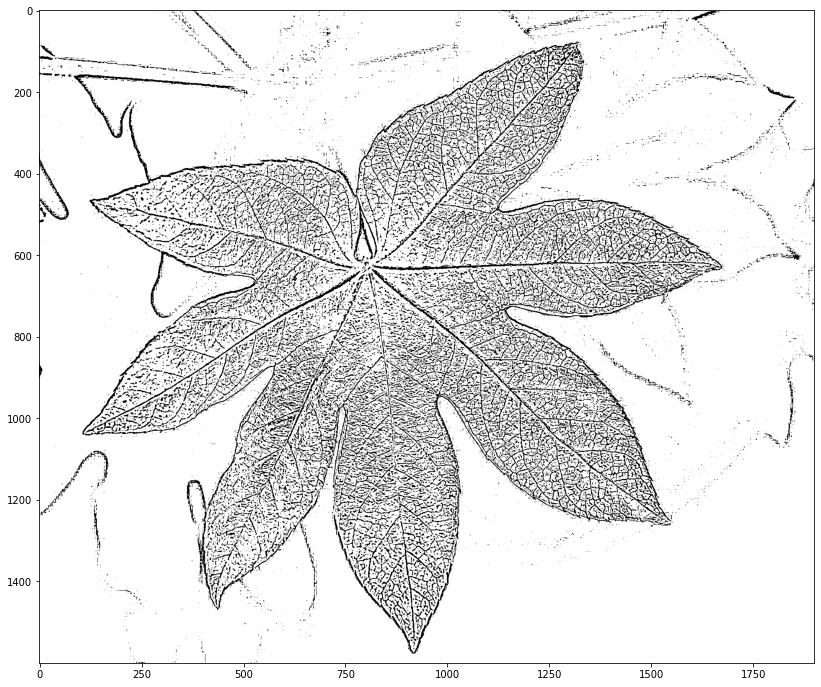

In [231]:

# adaptivni threshold gde se prag racuna = tezinska suma okolnih piksela, gde su tezine iz gausove raspodele
image_ada_bin = cv2.adaptiveThreshold(image_ada, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 15, 5)
plt.figure()
plt.imshow(image_ada_bin, 'gray')


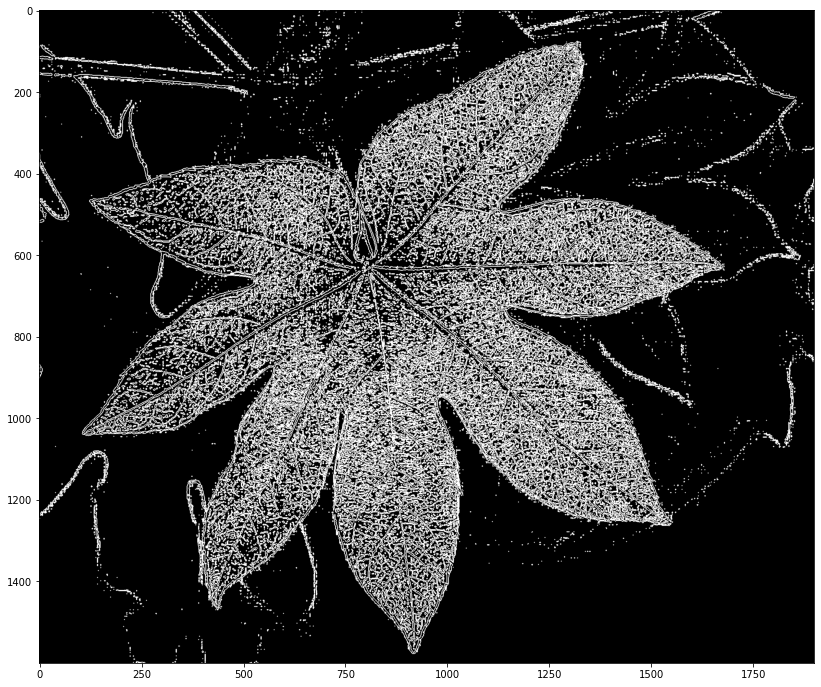

In [232]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
image_edges = cv2.dilate(image_ada_bin, kernel, iterations=1) - cv2.erode(image_ada_bin, kernel, iterations=1)
plt.imshow(image_edges, 'gray')

[[0 1 0]
 [1 1 1]
 [0 1 0]]


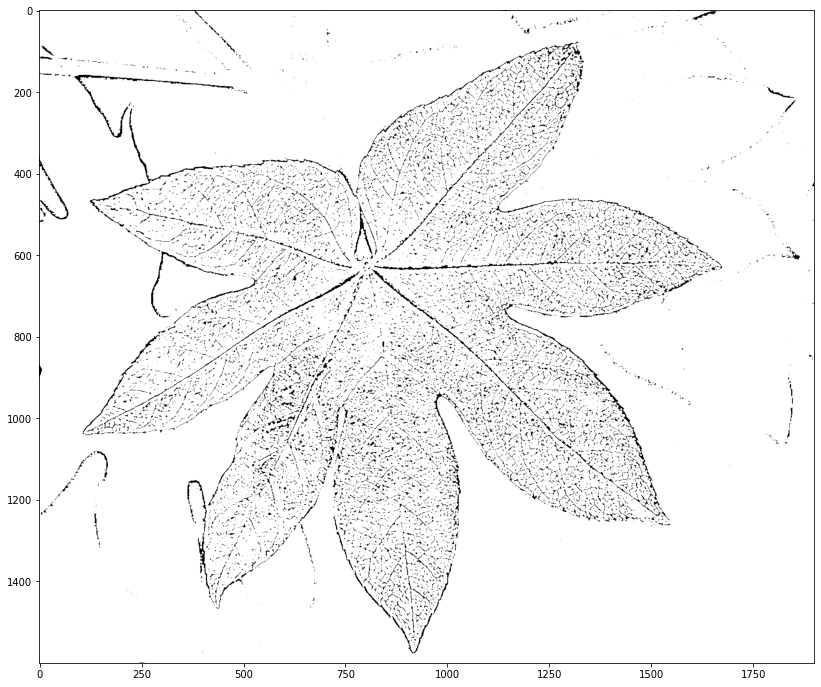

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
print(kernel)
img_ero = cv2.erode(image_ada_bin, kernel, iterations=1)
img_open = cv2.dilate(img_ero, kernel, iterations=2)
plt.imshow(img_open, 'gray')
image_ada_bin = img_open

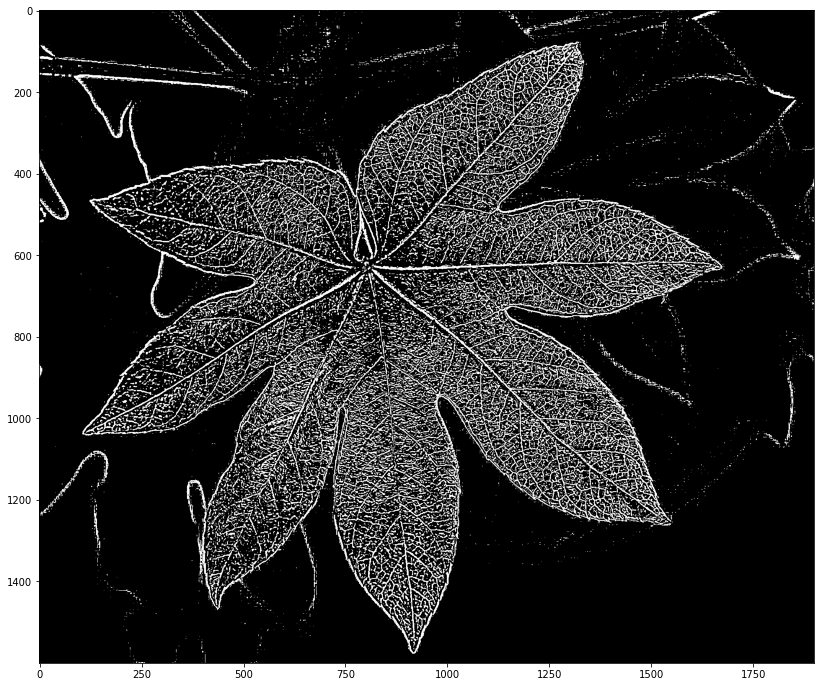

In [234]:
ret_otsu,im_bw_otsu = cv2.threshold(image_ada_bin,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plt.imshow(im_bw_otsu,cmap='Greys_r')

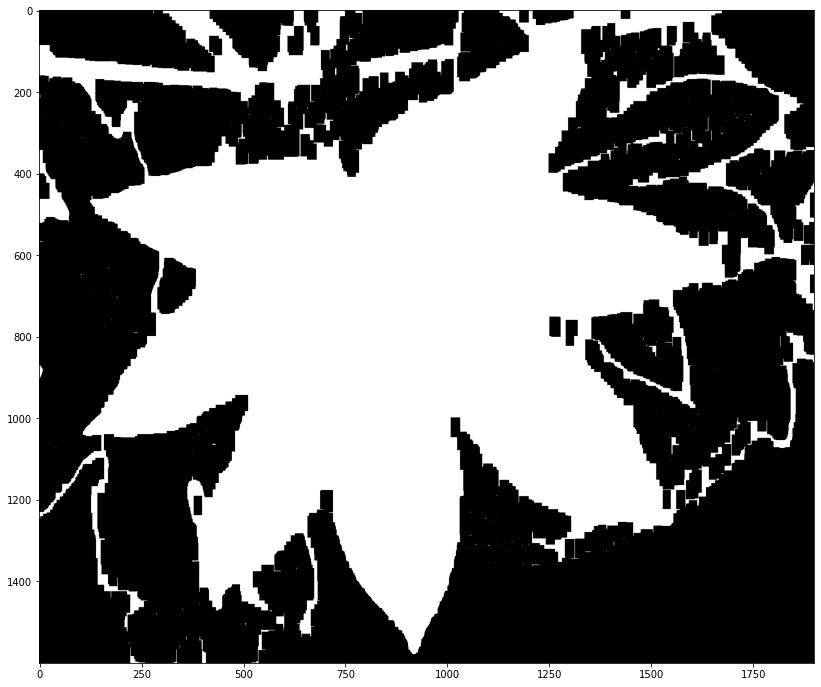

In [236]:
kernel = np.ones((40,20),np.uint8)
closing = cv2.morphologyEx(im_bw_otsu, cv2.MORPH_CLOSE, kernel)
plt.imshow(closing,cmap="Greys_r")

In [167]:
 contours, hierarchy = cv2.findContours(closing,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
 len(contours)

4

In [168]:
def find_contour(cnts):
    contains = []
    y_ri,x_ri, _ = resized_image.shape
    for cc in cnts:
        yn = cv2.pointPolygonTest(cc,(x_ri//2,y_ri//2),False)
        contains.append(yn)

    val = [contains.index(temp) for temp in contains if temp>0]
    print(contains)
    return val[0]

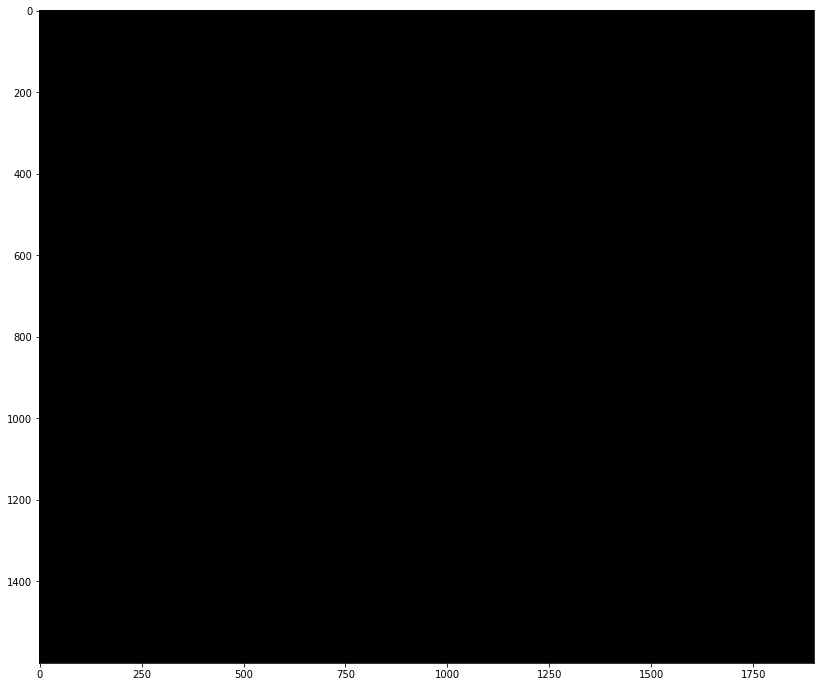

In [169]:
black_img = np.empty(image_ada_bin.shape,dtype=np.uint8)
black_img.fill(0)
plt.imshow(black_img,cmap="Greys_r")

In [211]:
index = find_contour(contours)
cnt = contours[index]
mask = cv2.drawContours(black_img, [cnt] , 0, (255,255,255), -1)


[1.0, -1.0, -1.0, -1.0]


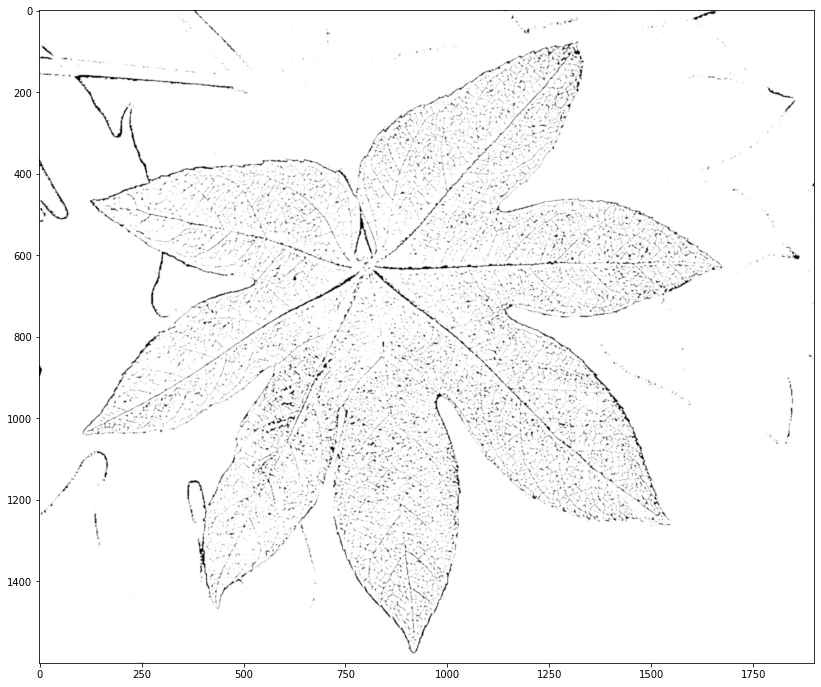

In [220]:
blur = cv2.GaussianBlur(image_ada_bin, (5,5),0)
plt.imshow(blur,cmap='Greys_r')



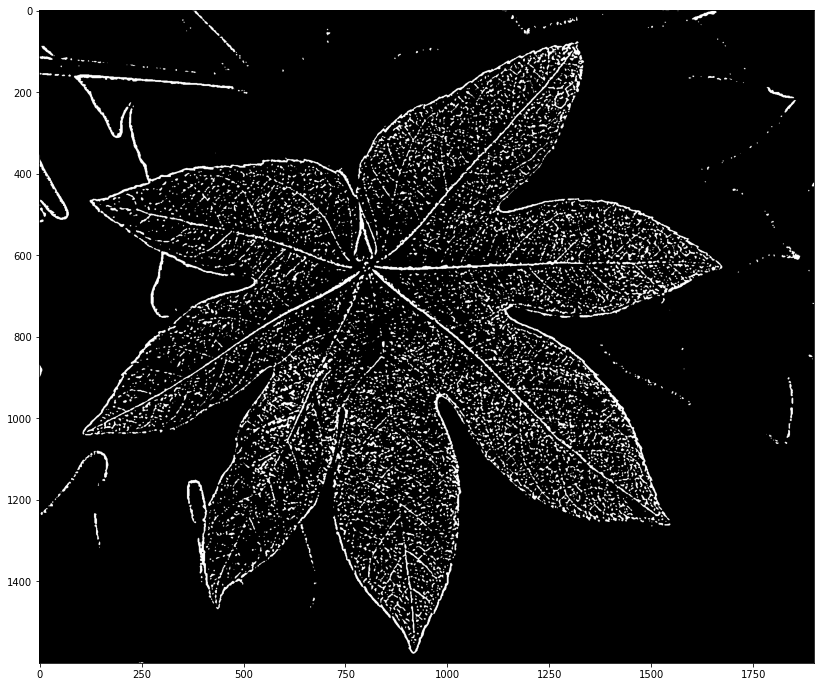

In [221]:

ret_otsu,im_bw_otsu = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plt.imshow(im_bw_otsu,cmap='Greys_r')

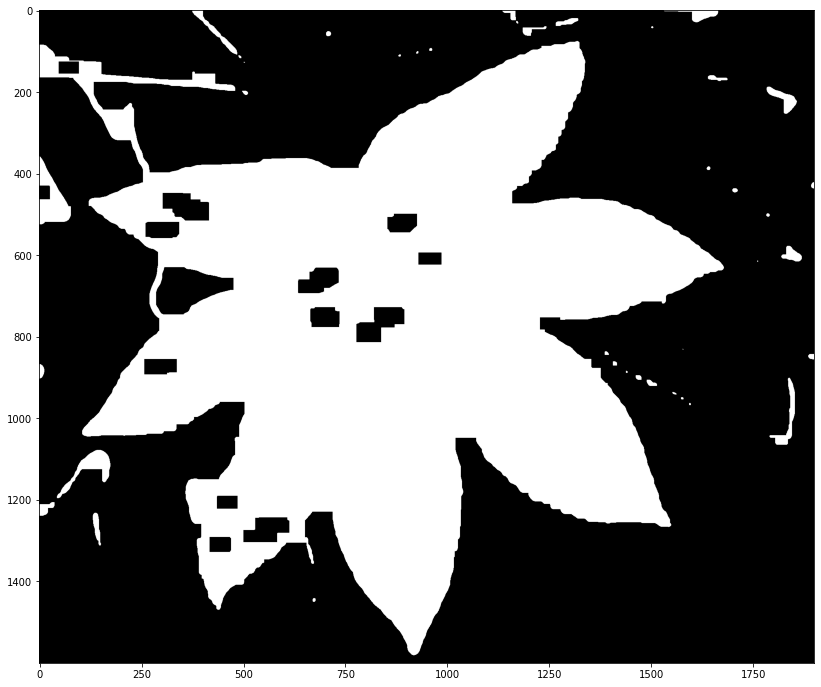

In [ ]:
kernel = np.ones((30,50),np.uint8)
closing = cv2.morphologyEx(im_bw_otsu, cv2.MORPH_CLOSE, kernel)
plt.imshow(closing,cmap='Greys_r')


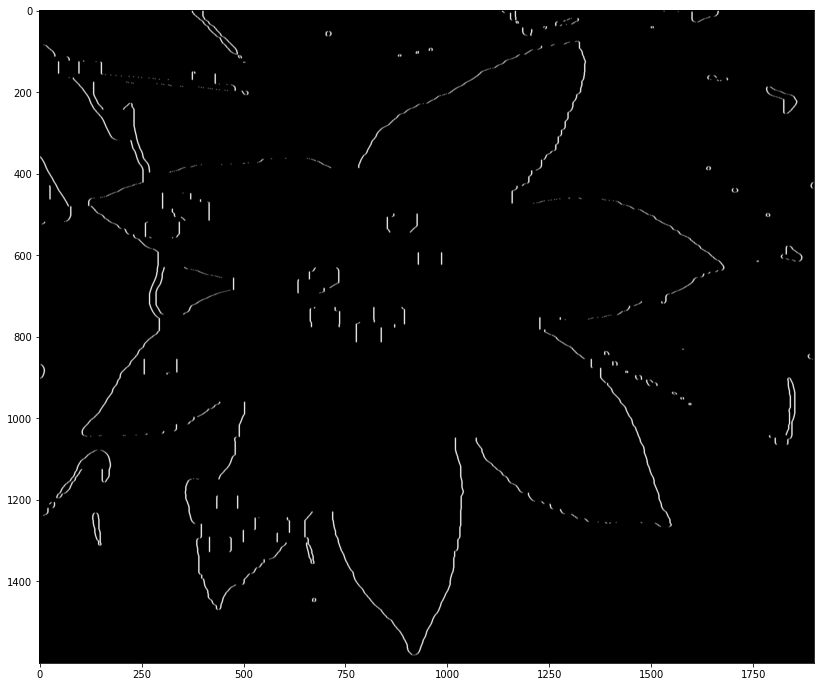

In [ ]:

sobelx64f = cv2.Sobel(closing,cv2.CV_64F,1,0,ksize=5)
abs_sobel64f = np.absolute(sobelx64f)
sobel_8u = np.uint8(abs_sobel64f)
plt.imshow(abs_sobel64f,cmap='Greys_r')



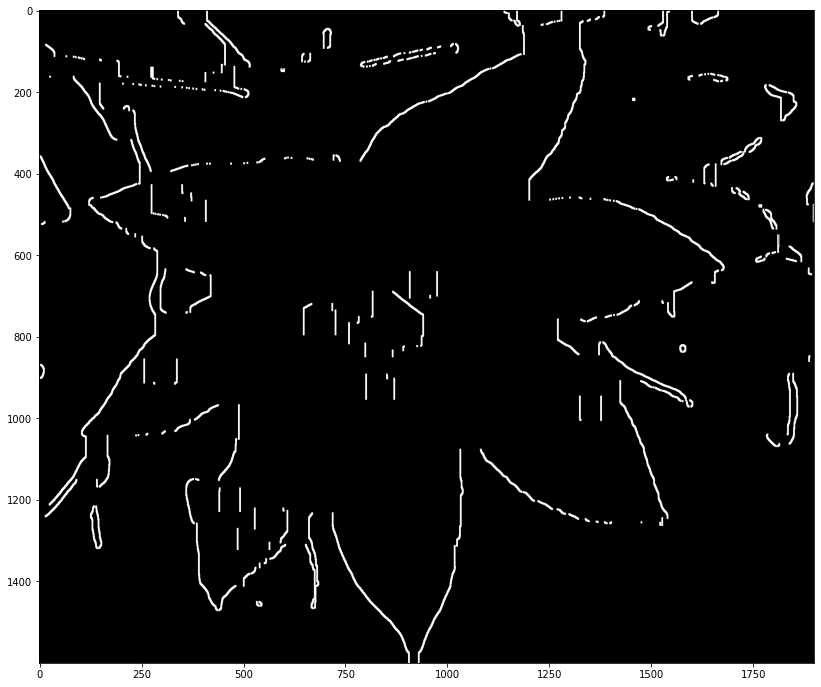

In [ ]:
ret_sobel,im_bw_sobel = cv2.threshold(sobel_8u,1,255,cv2.THRESH_BINARY)
plt.imshow(im_bw_sobel,cmap='Greys_r')


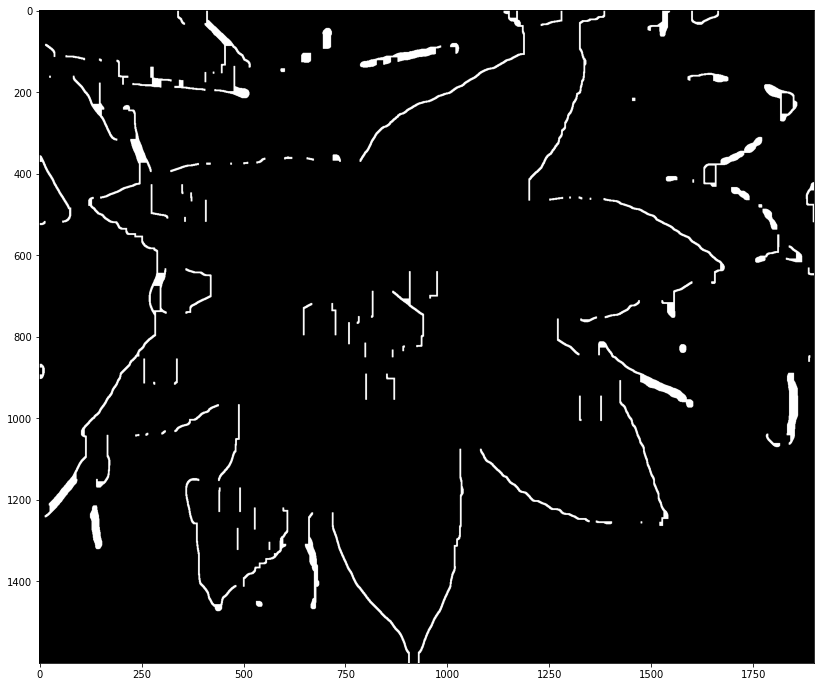

In [ ]:
kernel_edge = np.ones((15,15),np.uint8)
closing_edge = cv2.morphologyEx(im_bw_sobel, cv2.MORPH_CLOSE, kernel_edge)
plt.imshow(closing_edge,cmap='Greys_r')


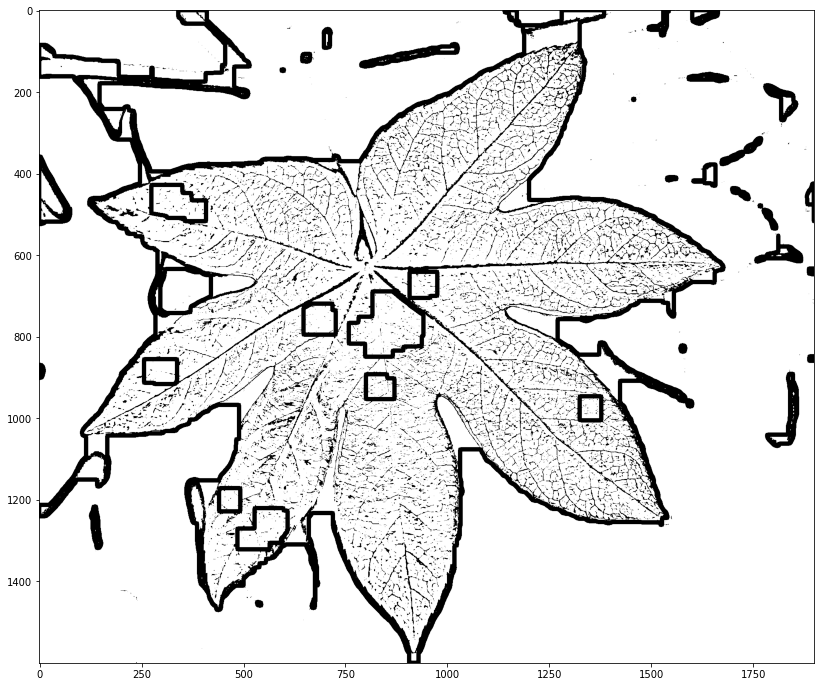

In [ ]:
contours, hierarchy = cv2.findContours(closing,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
plottedContour = cv2.drawContours(image_ada_bin,contours,-1,(0,255,0),10)
plt.imshow(plottedContour,cmap="Greys_r")